# Exploratory Data Analysis and Visualization
---

In this notebook, we start with preliminary EDA on our water consumption cleaned/combined dataset. We then explore county level correlations using Shapely files where each column will be mapped individually onto it's own graphic.

# Contents
- [I. Water Data Exploration](#I.-Water-Data-Exploration)
    - [Irrigation](#Irrigation)
    - [Livestock, Aquaculture, and Mining](#Livestock,-Aquaculture,-and-Mining)
    - [Thermoelectric](#Thermoelectric)
    - [Total Water Withdrawal and Use By Category](#Total-Water-Usage)
    - [Temperature and Drought Data Correlations](#Temperature-and-Drought-Data-Correlations)
- [II. Choropleth Visualizations](#II.-Choropleth-Visualizations)

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

from sklearn.metrics import ConfusionMatrixDisplay, classification_report
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# I. Water Data Exploration

In [2]:
df = pd.read_csv('../../data/clean-data/usco2015v2.0_clean2.csv')
df.head()

,STATE,COUNTY,FIPS,YEAR,TP-TotPop,PS-GWPop,PS-SWPop,PS-TOPop,PS-WGWTo,PS-WSWTo,PS-Wtotl,DO-SSPop,DO-SSPCp,DO-PSDel,DO-PSPCp,DO-WFrTo,DO-WDelv,IN-WGWTo,IN-WSWTo,IN-Wtotl,IR-WFrTo,IR-RecWW,IR-CUsFr,IR-IrTot,IC-WFrTo,IC-RecWW,IC-CUsFr,IC-IrTot,IG-WFrTo,IG-RecWW,IG-CUsFr,IG-IrTot,LI-WFrTo,AQ-WGWTo,AQ-WSWTo,AQ-Wtotl,MI-WGWTo,MI-WSWTo,MI-Wtotl,PT-WGWTo,PT-WSWTo,PT-Wtotl,PT-RecWW,PT-PSDel,PT-CUTot,PT-Power,PO-WGWTo,PO-WSWTo,PO-Wtotl,PO-RecWW,PO-PSDel,PO-CUTot,PO-Power,PC-WGWTo,PC-WSWTo,PC-Wtotl,PC-RecWW,PC-PSDel,PC-CUTot,PC-Power,TO-WGWTo,TO-WSWTo,TO-Wtotl,TO-CUTotPartial
0,AL,Autauga County,1001,2015,55.347,--,--,48.998,3.64,0.00,3.64,6.349,60.0,2.71,55.0,0.38,3.09,1.83,32.97,34.8,3.52,--,3.52,2.26,3.36,--,3.36,2.16,0.16,--,0.16,0.10,0.19,0.00,0.00,0.00,1.40,0.62,2.02,0.0,11.86,11.86,--,--,9.66,15711.64,0.0,0.0,0.0,--,--,0.0,0.0,0.0,11.86,11.86,--,--,9.66,15711.64,10.69,45.72,56.41,13.18
1,AL,Baldwin County,1003,2015,203.709,--,--,174.907,23.67,0.00,23.67,28.802,74.0,12.78,73.0,2.14,14.92,0.00,0.00,0.0,58.28,--,58.28,20.66,53.95,--,53.95,18.52,4.33,--,4.33,2.14,0.29,0.05,0.05,0.10,0.22,0.00,0.22,0.0,0.00,0.00,--,--,0.00,0.00,0.0,0.0,0.0,--,--,0.0,0.0,0.0,0.00,0.00,--,--,0.00,0.00,73.38,11.32,84.70,58.28
2,AL,Barbour County,1005,2015,26.489,--,--,24.587,3.23,0.00,3.23,1.902,63.0,1.42,58.0,0.12,1.54,1.50,0.00,1.5,2.96,--,2.96,4.53,2.49,--,2.49,4.23,0.47,--,0.47,0.30,0.41,0.18,0.18,0.36,0.30,0.14,0.44,0.0,0.00,0.00,--,--,0.00,0.00,0.0,0.0,0.0,--,--,0.0,0.0,0.0,0.00,0.00,--,--,0.00,0.00,6.06,2.96,9.02,2.96
3,AL,Bibb County,1007,2015,22.583,--,--,20.947,5.18,0.00,5.18,1.636,98.0,1.81,86.0,0.16,1.97,0.00,0.00,0.0,0.19,--,0.19,0.16,0.03,--,0.03,0.06,0.16,--,0.16,0.10,0.07,0.00,0.00,0.00,0.27,0.00,0.27,0.0,0.00,0.00,--,--,0.00,0.00,0.0,0.0,0.0,--,--,0.0,0.0,0.0,0.00,0.00,--,--,0.00,0.00,5.67,0.20,5.87,0.19
4,AL,Blount County,1009,2015,57.673,--,--,44.815,2.78,54.08,56.86,12.858,67.0,2.79,62.0,0.86,3.65,0.00,0.00,0.0,1.08,--,1.08,0.94,0.35,--,0.35,0.53,0.73,--,0.73,0.41,0.90,0.00,0.00,0.00,0.37,0.00,0.37,0.0,0.00,0.00,--,--,0.00,0.00,0.0,0.0,0.0,--,--,0.0,0.0,0.0,0.00,0.00,--,--,0.00,0.00,4.64,55.43,60.07,1.08


In [3]:
df.dtypes

STATE               object
COUNTY              object
FIPS                 int64
YEAR                 int64
TP-TotPop          float64
PS-GWPop            object
PS-SWPop            object
PS-TOPop           float64
PS-WGWTo           float64
PS-WSWTo           float64
PS-Wtotl           float64
DO-SSPop           float64
DO-SSPCp           float64
DO-PSDel           float64
DO-PSPCp           float64
DO-WFrTo           float64
DO-WDelv           float64
IN-WGWTo           float64
IN-WSWTo           float64
IN-Wtotl           float64
IR-WFrTo           float64
IR-RecWW            object
IR-CUsFr           float64
IR-IrTot           float64
IC-WFrTo           float64
IC-RecWW            object
IC-CUsFr            object
IC-IrTot           float64
IG-WFrTo           float64
IG-RecWW            object
IG-CUsFr            object
IG-IrTot           float64
LI-WFrTo           float64
AQ-WGWTo           float64
AQ-WSWTo           float64
AQ-Wtotl           float64
MI-WGWTo           float64
M

In [4]:
combo = pd.read_csv('../../data/clean-data/combined.csv')
combo.head()

,state,countyname,fips,lon,lat,tp_totpop,ps_gwpop,ps_swpop,ps_topop,ps_wgwto,ps_wswto,ps_wtotl,do_sspop,do_sspcp,do_psdel,do_pspcp,do_wfrto,do_wdelv_,in_wgwto,in_wswto,in_wtotl,ir_wfrto,ir_recww,ir_cusfr,ir_irtot,ic_wfrto,ic_recww,ic_cusfr,ic_irtot,ig_wfrto,ig_recww,ig_cusfr,ig_irtot,li_wfrto,aq_wgwto,aq_wswto,aq_wtotl,mi_wgwto,mi_wswto,mi_wtotl,pt_wgwto,pt_wswto,pt_wtotl,pt_recww,pt_psdel,pt_cutot,pt_power,po_wgwto,po_wswto,po_wtotl,po_recww,po_psdel,po_cutot,po_power,pc_wgwto,pc_wswto,pc_wtotl,pc_recww,pc_psdel,pc_cutot,pc_power,to_wgwto,to_wswto,to_wtotl,to_cutotpartial,population,median_household_income,tmean_c,tdmean_c,netmean_c,himean_c,hxmean_c,wbgtmean_c,flag_t,flag_td,flag_net,flag_hi,flag_hx,flag_wbgt,normal_wet,abnormally_dry,moderate_drought,severe_drought,extreme_drought,exceptional_drought
0,ME,Washington,23029,-67.6361,45.0363,31.625,9.446,1.900,11.346,1.38,0.19,1.57,20.279,53.0,0.58,51.0,1.07,1.65,0.39,26.98,27.37,7.37,0.0,7.02,15.18,7.34,0.0,6.99,15.13,0.03,0.0,0.03,0.05,0.01,0.00,9.90,9.90,0.01,0.10,0.11,0.35,0.00,0.35,0.0,0.00,0.25,125.81,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.35,0.0,0.35,0.0,0.00,0.25,125.81,6.88,40.87,47.75,7.27,32191.0,38083.0,6.65,2.39,-2.55,6.35,6.24,6.20,0.0,0.0,0.0,0.0,0.0,0.0,86.78,13.22,0.00,0.0,0.0,0.0
1,GA,McIntosh,13191,-81.2646,31.5329,13.969,10.497,0.000,10.497,1.04,0.00,1.04,3.472,75.0,0.94,90.0,0.26,1.20,0.02,0.00,0.02,0.16,0.0,0.16,0.15,0.00,0.0,0.00,0.00,0.16,0.0,0.16,0.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,1.48,0.00,1.48,0.16,14007.0,42988.0,20.64,16.44,14.46,21.35,26.32,19.77,0.0,0.0,0.0,0.0,0.0,0.0,75.07,24.93,2.25,0.0,0.0,0.0
2,GA,Liberty,13179,-81.2103,31.7093,62.467,51.264,0.000,51.264,6.42,0.00,6.42,11.203,75.0,3.18,62.0,0.84,4.02,10.43,0.63,11.06,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.02,0.00,0.00,0.00,0.03,0.09,0.12,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,17.72,0.74,18.46,0.00,64427.0,42201.0,20.14,15.37,14.95,20.68,25.22,19.19,0.0,0.0,0.0,0.0,0.0,0.0,84.02,15.98,0.21,0.0,0.0,0.0
3,CT,Hartford,9003,-72.7328,41.8064,895.841,78.563,671.826,750.389,12.78,46.44,59.22,145.452,34.0,25.29,34.0,4.90,30.19,9.02,97.25,106.27,4.09,0.0,3.90,7.09,2.41,0.0,2.30,4.95,1.68,0.0,1.60,2.14,0.07,0.79,12.96,13.75,0.11,0.48,0.59,0.00,71.56,71.56,0.0,0.43,0.98,614.78,0.0,71.56,71.56,0.0,0.0,0.67,421.59,0.00,0.0,0.00,0.0,0.43,0.31,193.19,28.24,232.21,260.45,4.88,896943.0,66395.0,10.22,4.46,3.57,9.94,10.56,9.30,0.0,0.0,0.0,0.0,0.0,0.0,39.70,60.30,30.55,0.0,0.0,0.0
4,CT,Tolland,9013,-72.3365,41.8550,151.420,45.125,46.224,91.349,3.29,1.64,4.93,60.071,42.0,3.83,42.0,2.52,6.35,0.47,0.53,1.00,0.50,0.0,0.47,0.80,0.23,0.0,0.21,0.45,0.27,0.0,0.26,0.35,0.18,0.00,0.00,0.00,0.09,0.45,0.54,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,6.83,2.84,9.67,0.47,151948.0,79626.0,9.85,4.09,2.84,9.55,10.03,8.88,0.0,0.0,0.0,0.0,0.0,0.0,40.99,59.01,29.40,0.0,0.0,0.0


In [5]:
combo.dtypes

state                       object
countyname                  object
fips                         int64
lon                        float64
lat                        float64
tp_totpop                  float64
ps_gwpop                   float64
ps_swpop                   float64
ps_topop                   float64
ps_wgwto                   float64
ps_wswto                   float64
ps_wtotl                   float64
do_sspop                   float64
do_sspcp                   float64
do_psdel                   float64
do_pspcp                   float64
do_wfrto                   float64
do_wdelv_                  float64
in_wgwto                   float64
in_wswto                   float64
in_wtotl                   float64
ir_wfrto                   float64
ir_recww                   float64
ir_cusfr                   float64
ir_irtot                   float64
ic_wfrto                   float64
ic_recww                   float64
ic_cusfr                   float64
ic_irtot            

In [6]:
combo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3196 entries, 0 to 3195
Data columns (total 85 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   state                    3196 non-null   object 
 1   countyname               3196 non-null   object 
 2   fips                     3196 non-null   int64  
 3   lon                      3196 non-null   float64
 4   lat                      3196 non-null   float64
 5   tp_totpop                3196 non-null   float64
 6   ps_gwpop                 3196 non-null   float64
 7   ps_swpop                 3196 non-null   float64
 8   ps_topop                 3196 non-null   float64
 9   ps_wgwto                 3196 non-null   float64
 10  ps_wswto                 3196 non-null   float64
 11  ps_wtotl                 3196 non-null   float64
 12  do_sspop                 3196 non-null   float64
 13  do_sspcp                 3196 non-null   float64
 14  do_psdel                

In [7]:
combo.describe()

,fips,lon,lat,tp_totpop,ps_gwpop,ps_swpop,ps_topop,ps_wgwto,ps_wswto,ps_wtotl,do_sspop,do_sspcp,do_psdel,do_pspcp,do_wfrto,do_wdelv_,in_wgwto,in_wswto,in_wtotl,ir_wfrto,ir_recww,ir_cusfr,ir_irtot,ic_wfrto,ic_recww,ic_cusfr,ic_irtot,ig_wfrto,ig_recww,ig_cusfr,ig_irtot,li_wfrto,aq_wgwto,aq_wswto,aq_wtotl,mi_wgwto,mi_wswto,mi_wtotl,pt_wgwto,pt_wswto,pt_wtotl,pt_recww,pt_psdel,pt_cutot,pt_power,po_wgwto,po_wswto,po_wtotl,po_recww,po_psdel,po_cutot,po_power,pc_wgwto,pc_wswto,pc_wtotl,pc_recww,pc_psdel,pc_cutot,pc_power,to_wgwto,to_wswto,to_wtotl,to_cutotpartial,population,median_household_income,tmean_c,tdmean_c,netmean_c,himean_c,hxmean_c,wbgtmean_c,flag_t,flag_td,flag_net,flag_hi,flag_hx,flag_wbgt,normal_wet,abnormally_dry,moderate_drought,severe_drought,extreme_drought,exceptional_drought
count,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3.196000e+03,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000,3196.000000
mean,30705.038173,-91.307263,38.209223,108.622231,22.127767,37.863889,94.684014,4.856511,7.631148,12.487660,13.938217,80.797559,7.686909,86.772215,1.068057,8.754966,0.866374,3.819549,4.685923,36.963232,0.224355,22.907575,20.011596,22.062910,0.115885,14.528242,10.613245,0.344233,0.094227,0.330645,0.281105,0.627681,0.447644,1.783436,2.231079,0.875413,0.339115,1.214528,0.183858,46.499315,46.683173,0.067982,0.078802,1.389703,1068.878573,0.035219,45.065591,45.100810,0.003864,0.016161,0.477675,405.717944,0.148639,1.433723,1.582362,0.064118,0.062641,0.912028,663.160629,26.654797,79.306536,105.961333,24.297278,1.064861e+05,47009.128648,13.690709,7.220715,6.625248,13.553067,15.124494,12.280374,0.007196,0.007196,0.007196,0.007196,0.007196,0.007196,66.497434,33.064531,14.673486,6.920272,3.452215,1.371874
std,14978.395842,11.538346,4.849978,343.446644,98.828993,178.898038,335.898847,20.350200,36.228793,46.757577,25.015823,43.331455,28.815697,54.473161,1.891681,29.410257,3.902010,34.041796,34.545873,130.297970,2.279905,85.961201,56.260438,109.757651,1.668947,76.832101,45.620405,1.968413,0.927673,2.019177,0.926274,1.413243,3.792217,21.497801,21.979966,4.851112,3.096496,5.959682,1.506520,236.217492,236.271806,1.291173,1.169813,7.221993,3515.737073,0.638275,235.137051,235.166999,0.103251,0.808951,2.721977,2069.199183,1.355921,15.370050,15.434451,1.279792,0.829283,6.510083,2660.519656,88.275297,259.554656,285.319112,86.549573,3.362105e+05,12215.115930,4.424612,4.892613,5.338246,4.719467,6.292386,4.323561,0.131006,0.131006,0.131006,0.131006,0.131006,0.131006,24.850366,24.553840,23.071024,18.616941,14.270868,10.243694
min,1001.000000,-124.156700,24.651400,0.112000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

## Irrigation

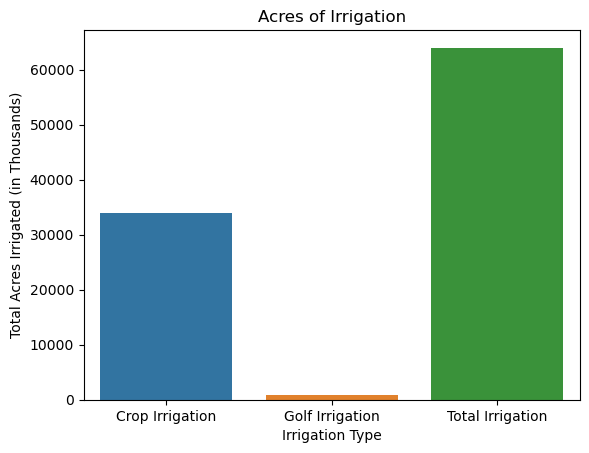

In [8]:
a = combo['ic_irtot'].sum()
b = combo['ig_irtot'].sum()
c = combo['ir_irtot'].sum()

categories = ['Crop Irrigation', 'Golf Irrigation', 'Total Irrigation']

# Create a bar plot
sns.barplot(x=categories, y=[a, b, c])

# Add labels and title
plt.xlabel('Irrigation Type', fontweight='normal')
plt.ylabel('Total Acres Irrigated (in Thousands)', fontweight='normal')
plt.title('Acres of Irrigation', fontweight='normal')
plt.xticks(fontweight='normal')
plt.yticks(fontweight='normal')

# Display the plot
plt.show()


# Note: Crop + Golf did not equal total approximately 30% of the time (due to 0s / nulls), therefore, did not make a stacked bar chart

## Livestock, Aquaculture, and Mining

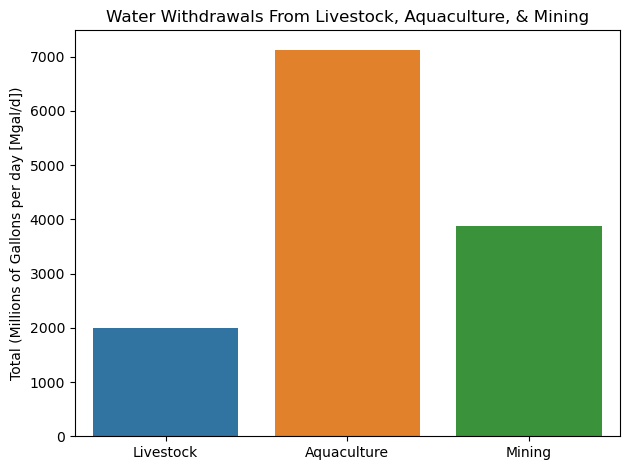

In [9]:
a = combo['li_wfrto'].sum()
b = combo['aq_wtotl'].sum()
c = combo['mi_wtotl'].sum()

categories = ['Livestock', 'Aquaculture', 'Mining']

# Create a bar plot
sns.barplot(x=categories, y=[a, b, c])

# Add labels and title
#plt.xlabel('Withdrawals', fontweight='bold')
plt.ylabel('Total (Millions of Gallons per day [Mgal/d])', fontweight='normal')
plt.title('Water Withdrawals From Livestock, Aquaculture, & Mining', fontweight='normal')
plt.xticks(fontweight='normal')
plt.yticks(fontweight='normal')

plt.tight_layout()
plt.savefig('./images/li_aqua_min.png')

# Display the plot
plt.show()

## Thermoelectric

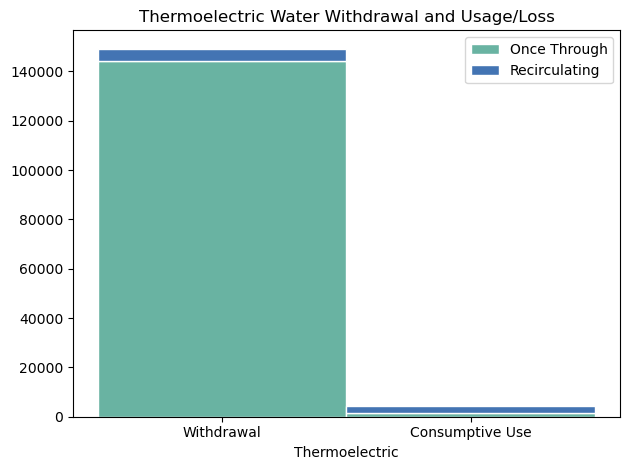

In [10]:
pt_tot1 = combo['po_wtotl'].sum()
pt_tot2 = combo['pc_wtotl'].sum()
pt_cu1 = combo['po_cutot'].sum()
pt_cu2 = combo['pc_cutot'].sum()


# Values of each group
bars1 = [pt_tot1, pt_cu1]
bars2 = [pt_tot2, pt_cu2]
 
# Heights of bars1 + bars2
bars = np.add(bars1, bars2).tolist()
 
# The position of the bars on the x-axis
r = [0,1]
 
# Names of group and bar width
names = ['Withdrawal','Consumptive Use']
barWidth = 1
 
# Create brown bars
plt.bar(r, bars1, color='#69b3a2', edgecolor='white', width=barWidth, label = "Once Through")
# Create green bars (middle), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#4374B3', edgecolor='white', width=barWidth, label = "Recirculating")
 
# Custom X axis
plt.xticks(r, names, fontweight='normal')
plt.yticks(fontweight='normal')
plt.xlabel("Thermoelectric", fontweight='normal')
plt.title("Thermoelectric Water Withdrawal and Usage/Loss")
plt.legend()

plt.tight_layout()
plt.savefig('./images/thermo_once_vs_recirc.png')

# Show graphic
plt.show()

## Total Water Withdrawal and Use By Category

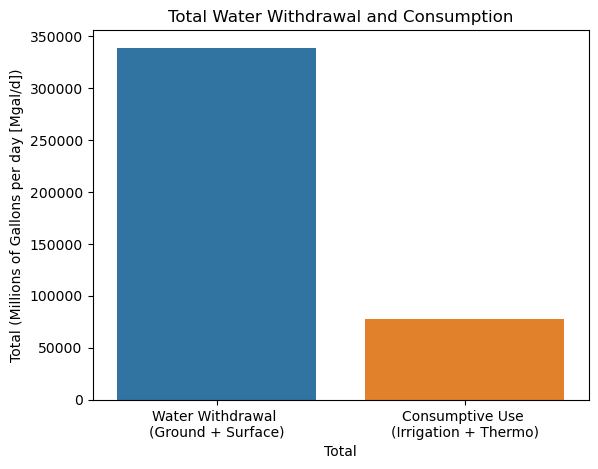

In [11]:
a = combo['to_wtotl'].sum()
b = combo['to_cutotpartial'].sum()


categories = ['Water Withdrawal \n(Ground + Surface)', 'Consumptive Use \n(Irrigation + Thermo)']

# Create a bar plot
sns.barplot(x=categories, y=[a, b])

# Add labels and title
plt.xlabel('Total', fontweight='normal')
plt.ylabel('Total (Millions of Gallons per day [Mgal/d])', fontweight='normal')
plt.title('Total Water Withdrawal and Consumption', fontweight='normal')
plt.xticks(fontweight='normal')
plt.yticks(fontweight='normal')

# Display the plot
plt.show()

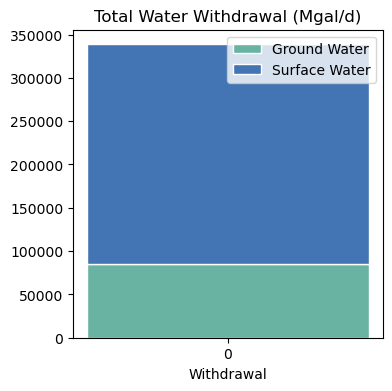

In [12]:
tot1 = combo['to_wgwto'].sum()
tot2 = combo['to_wswto'].sum()
consump1 = combo['ir_cusfr'].sum()
consump2 = combo['pt_cutot'].sum()

plt.figure(figsize=(4,4))

# Values of each group
bars1 = [tot1]
bars2 = [tot2]
 
# Heights of bars1 + bars2
bars = np.add(bars1, bars2).tolist()
 
# The position of the bars on the x-axis
r = [0]
 
# Names of group and bar width
barWidth = 1
 
# Create brown bars
plt.bar(r, bars1, color='#69b3a2', edgecolor='white', width=barWidth, label = "Ground Water")
# Create green bars (middle), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#4374B3', edgecolor='white', width=barWidth, label = "Surface Water")
 
# Custom X axis
plt.xticks(r, fontweight='normal')
plt.yticks(fontweight='normal')
plt.xlabel("Withdrawal", fontweight='normal')
plt.title("Total Water Withdrawal (Mgal/d)")
plt.legend()

# Show graphic
plt.show()

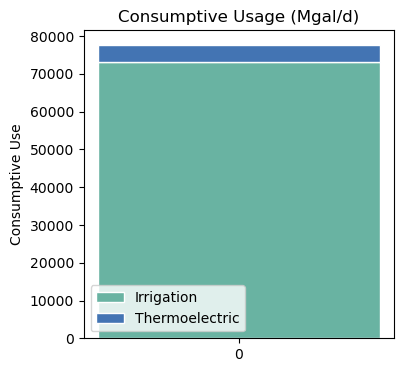

In [13]:
tot1 = combo['to_wgwto'].sum()
tot2 = combo['to_wswto'].sum()
consump1 = combo['ir_cusfr'].sum()
consump2 = combo['pt_cutot'].sum()

plt.figure(figsize=(4,4))

# Values of each group
bars1 = [consump1]
bars2 = [consump2]
 
# Heights of bars1 + bars2
bars = np.add(bars1, bars2).tolist()
 
# The position of the bars on the x-axis
r = [0]
 
# Names of group and bar width
barWidth = 1
 
# Create brown bars
plt.bar(r, bars1, color='#69b3a2', edgecolor='white', width=barWidth, label = "Irrigation")
# Create green bars (middle), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#4374B3', edgecolor='white', width=barWidth, label = "Thermoelectric")
 
# Custom X axis
plt.xticks(r, fontweight='normal')
plt.yticks(fontweight='normal')
plt.ylabel("Consumptive Use", fontweight='normal')
plt.title("Consumptive Usage (Mgal/d)")
plt.legend()

# Show graphic
plt.show()

In [14]:
# Map states to regions for potential use (UPDATE: did not end up using)
state_to_region = {
    'AL': 'Southeast',
    'AK': 'West',
    'AZ': 'West',
    'AR': 'South',
    'CA': 'West',
    'CO': 'West',
    'CT': 'Northeast',
    'DE': 'Northeast',
    'FL': 'Southeast',
    'GA': 'Southeast',
    'HI': 'West',
    'ID': 'West',
    'IL': 'Midwest',
    'IN': 'Midwest',
    'IA': 'Midwest',
    'KS': 'Midwest',
    'KY': 'Southeast',
    'LA': 'South',
    'ME': 'Northeast',
    'MD': 'Northeast',
    'MA': 'Northeast',
    'MI': 'Midwest',
    'MN': 'Midwest',
    'MS': 'Southeast',
    'MO': 'Midwest',
    'MT': 'West',
    'NE': 'Midwest',
    'NV': 'West',
    'NH': 'Northeast',
    'NJ': 'Northeast',
    'NM': 'West',
    'NY': 'Northeast',
    'NC': 'Southeast',
    'ND': 'Midwest',
    'OH': 'Midwest',
    'OK': 'South',
    'OR': 'West',
    'PA': 'Northeast',
    'RI': 'Northeast',
    'SC': 'Southeast',
    'SD': 'Midwest',
    'TN': 'Southeast',
    'TX': 'South',
    'UT': 'West',
    'VT': 'Northeast',
    'VA': 'Southeast',
    'WA': 'West',
    'WV': 'Southeast',
    'WI': 'Midwest',
    'WY': 'West',
    'DC': 'Northeast'
}

states = list(state_to_region.keys())
regions = list(state_to_region.values())

st_region_df = pd.DataFrame({'state': states, 'region': regions})

In [15]:
combo2 = combo.merge(st_region_df, how='left', on = 'state')

In [16]:
combo2.head()

,state,countyname,fips,lon,lat,tp_totpop,ps_gwpop,ps_swpop,ps_topop,ps_wgwto,ps_wswto,ps_wtotl,do_sspop,do_sspcp,do_psdel,do_pspcp,do_wfrto,do_wdelv_,in_wgwto,in_wswto,in_wtotl,ir_wfrto,ir_recww,ir_cusfr,ir_irtot,ic_wfrto,ic_recww,ic_cusfr,ic_irtot,ig_wfrto,ig_recww,ig_cusfr,ig_irtot,li_wfrto,aq_wgwto,aq_wswto,aq_wtotl,mi_wgwto,mi_wswto,mi_wtotl,pt_wgwto,pt_wswto,pt_wtotl,pt_recww,pt_psdel,pt_cutot,pt_power,po_wgwto,po_wswto,po_wtotl,po_recww,po_psdel,po_cutot,po_power,pc_wgwto,pc_wswto,pc_wtotl,pc_recww,pc_psdel,pc_cutot,pc_power,to_wgwto,to_wswto,to_wtotl,to_cutotpartial,population,median_household_income,tmean_c,tdmean_c,netmean_c,himean_c,hxmean_c,wbgtmean_c,flag_t,flag_td,flag_net,flag_hi,flag_hx,flag_wbgt,normal_wet,abnormally_dry,moderate_drought,severe_drought,extreme_drought,exceptional_drought,region
0,ME,Washington,23029,-67.6361,45.0363,31.625,9.446,1.900,11.346,1.38,0.19,1.57,20.279,53.0,0.58,51.0,1.07,1.65,0.39,26.98,27.37,7.37,0.0,7.02,15.18,7.34,0.0,6.99,15.13,0.03,0.0,0.03,0.05,0.01,0.00,9.90,9.90,0.01,0.10,0.11,0.35,0.00,0.35,0.0,0.00,0.25,125.81,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.35,0.0,0.35,0.0,0.00,0.25,125.81,6.88,40.87,47.75,7.27,32191.0,38083.0,6.65,2.39,-2.55,6.35,6.24,6.20,0.0,0.0,0.0,0.0,0.0,0.0,86.78,13.22,0.00,0.0,0.0,0.0,Northeast
1,GA,McIntosh,13191,-81.2646,31.5329,13.969,10.497,0.000,10.497,1.04,0.00,1.04,3.472,75.0,0.94,90.0,0.26,1.20,0.02,0.00,0.02,0.16,0.0,0.16,0.15,0.00,0.0,0.00,0.00,0.16,0.0,0.16,0.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,1.48,0.00,1.48,0.16,14007.0,42988.0,20.64,16.44,14.46,21.35,26.32,19.77,0.0,0.0,0.0,0.0,0.0,0.0,75.07,24.93,2.25,0.0,0.0,0.0,Southeast
2,GA,Liberty,13179,-81.2103,31.7093,62.467,51.264,0.000,51.264,6.42,0.00,6.42,11.203,75.0,3.18,62.0,0.84,4.02,10.43,0.63,11.06,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.02,0.00,0.00,0.00,0.03,0.09,0.12,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,17.72,0.74,18.46,0.00,64427.0,42201.0,20.14,15.37,14.95,20.68,25.22,19.19,0.0,0.0,0.0,0.0,0.0,0.0,84.02,15.98,0.21,0.0,0.0,0.0,Southeast
3,CT,Hartford,9003,-72.7328,41.8064,895.841,78.563,671.826,750.389,12.78,46.44,59.22,145.452,34.0,25.29,34.0,4.90,30.19,9.02,97.25,106.27,4.09,0.0,3.90,7.09,2.41,0.0,2.30,4.95,1.68,0.0,1.60,2.14,0.07,0.79,12.96,13.75,0.11,0.48,0.59,0.00,71.56,71.56,0.0,0.43,0.98,614.78,0.0,71.56,71.56,0.0,0.0,0.67,421.59,0.00,0.0,0.00,0.0,0.43,0.31,193.19,28.24,232.21,260.45,4.88,896943.0,66395.0,10.22,4.46,3.57,9.94,10.56,9.30,0.0,0.0,0.0,0.0,0.0,0.0,39.70,60.30,30.55,0.0,0.0,0.0,Northeast
4,CT,Tolland,9013,-72.3365,41.8550,151.420,45.125,46.224,91.349,3.29,1.64,4.93,60.071,42.0,3.83,42.0,2.52,6.35,0.47,0.53,1.00,0.50,0.0,0.47,0.80,0.23,0.0,0.21,0.45,0.27,0.0,0.26,0.35,0.18,0.00,0.00,0.00,0.09,0.45,0.54,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,6.83,2.84,9.67,0.47,151948.0,79626.0,9.85,4.09,2.84,9.55,10.03,8.88,0.0,0.0,0.0,0.0,0.0,0.0,40.99,59.01,29.40,0.0,0.0,0.0,Northeast


In [17]:
combo2.region.value_counts()

Midwest      1059
Southeast     982
South         471
West          414
Northeast     270
Name: region, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


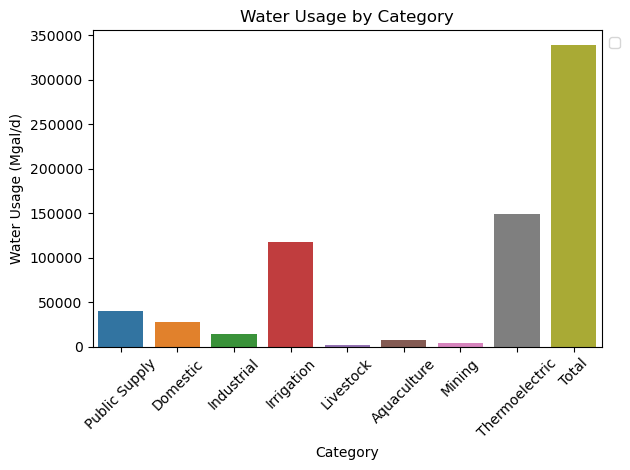

In [18]:
#ps = combo2.groupby('region')['ps_wtotl'].sum()
#do = combo2.groupby('region')['do_wdelv_'].sum()
#ind = combo2.groupby('region')['in_wtotl'].sum()
#ir = combo2.groupby('region')['ir_wfrto'].sum()
#li = combo2.groupby('region')['li_wfrto'].sum()
#aq = combo2.groupby('region')['aq_wtotl'].sum()
#mi = combo2.groupby('region')['mi_wtotl'].sum()
#pt = combo2.groupby('region')['pt_wtotl'].sum()
#to = combo2.groupby('region')['to_wtotl'].sum()

ps = combo2['ps_wtotl'].sum()
do = combo2['do_wdelv_'].sum()
ind = combo2['in_wtotl'].sum()
ir = combo2['ir_wfrto'].sum()
li = combo2['li_wfrto'].sum()
aq = combo2['aq_wtotl'].sum()
mi = combo2['mi_wtotl'].sum()
pt = combo2['pt_wtotl'].sum()
to = combo2['to_wtotl'].sum()

catx = ['Public Supply', 'Domestic', 'Industrial', 'Irrigation', 'Livestock', 'Aquaculture', 'Mining', 'Thermoelectric', 'Total']

sns.barplot(x=catx, y=[ps, do, ind, ir, li, aq, mi, pt, to])

plt.xlabel("Category", fontweight='normal')
plt.ylabel("Water Usage (Mgal/d)", fontweight='normal')
plt.title("Water Usage by Category", fontweight='normal')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45, fontweight='normal')
plt.yticks(fontweight='normal')
plt.tight_layout()

# Show the plot
plt.show();

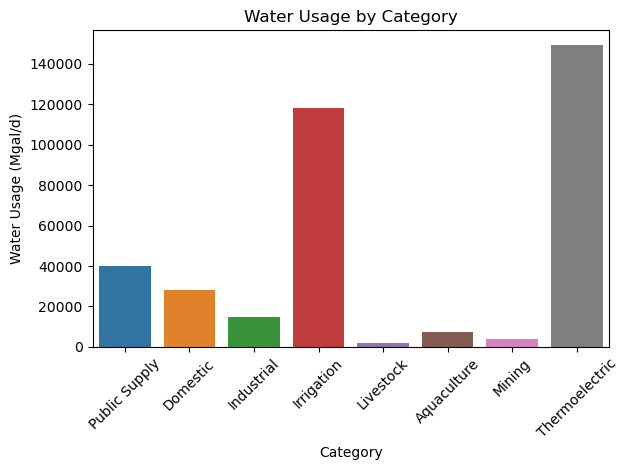

In [19]:
# WITHOUT TOTAL
ps = combo2['ps_wtotl'].sum()
do = combo2['do_wdelv_'].sum()
ind = combo2['in_wtotl'].sum()
ir = combo2['ir_wfrto'].sum()
li = combo2['li_wfrto'].sum()
aq = combo2['aq_wtotl'].sum()
mi = combo2['mi_wtotl'].sum()
pt = combo2['pt_wtotl'].sum()
#to = combo2['to_wtotl'].sum()

catx = ['Public Supply', 'Domestic', 'Industrial', 'Irrigation', 'Livestock', 'Aquaculture', 'Mining', 'Thermoelectric']

sns.barplot(x=catx, y=[ps, do, ind, ir, li, aq, mi, pt])

plt.xlabel("Category", fontweight='normal')
plt.ylabel("Water Usage (Mgal/d)", fontweight='normal')
plt.title("Water Usage by Category", fontweight='normal')
plt.xticks(rotation=45, fontweight='normal')
plt.yticks(fontweight='normal')
plt.tight_layout()

#plt.legend(labels=catx, loc='upper left', bbox_to_anchor=(1, 1))

plt.savefig('./images/Water_Usage_by_Cat.png')
plt.show();


## Temperature and Drought Data Correlations

C:\Users\farah\AppData\Local\Temp\ipykernel_33192\1064931214.py:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = f.corr()


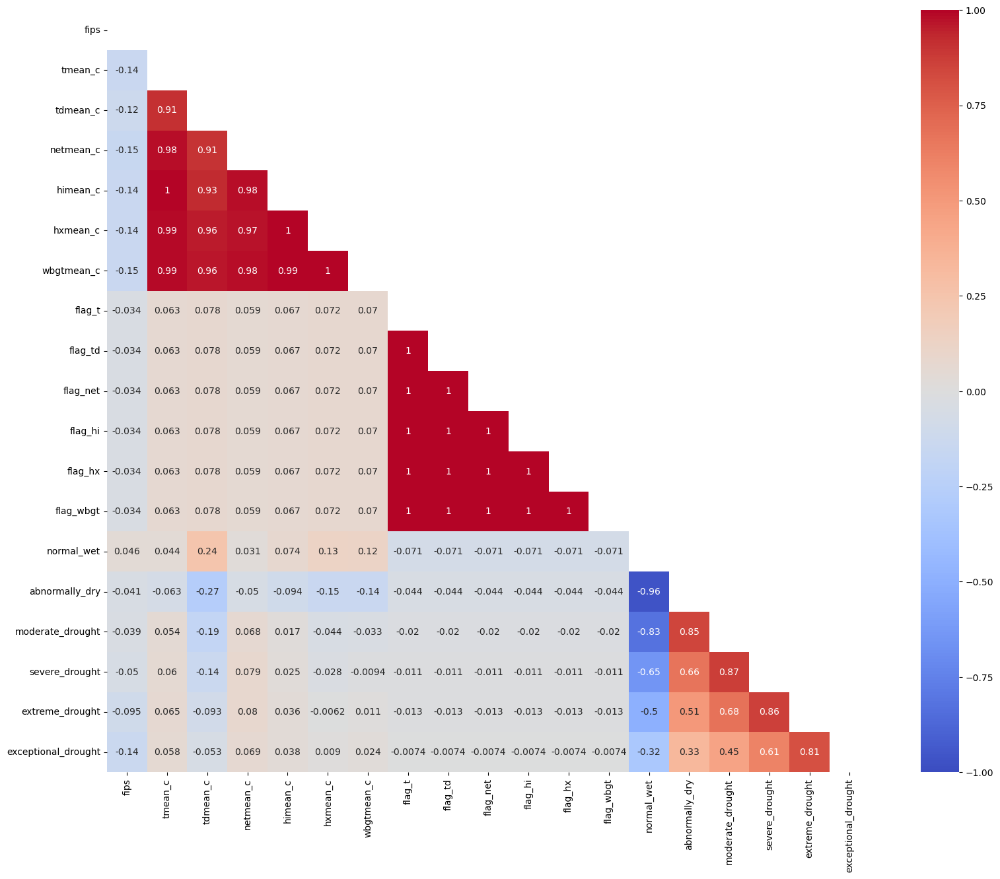

In [20]:
f = combo.filter(items = ['state', 'fips', 'tmean_c', 'tdmean_c', 'netmean_c', 'himean_c', 'hxmean_c', 'wbgtmean_c', 'flag_t', 'flag_td', 'flag_net', 'flag_hi', 'flag_hx', 
                          'flag_wbgt', 'normal_wet', 'abnormally_dry', 'moderate_drought', 'severe_drought', 'extreme_drought', 'exceptional_drought'])
plt.figure(figsize = (20,15))

# Get correlation of variables.
corr = f.corr()

# Set up mask to be "True" in the upper triangle.
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Plot our correlation heatmap, while masking the upper triangle to be white.
sns.heatmap(corr, 
            mask = mask, 
            square = True, 
            cmap = 'coolwarm', 
            annot = True, 
            vmin = -1, 
            vmax = 1);

plt.xticks(fontweight='normal')
plt.yticks(fontweight='normal');

# II. Choropleth Visualizations

In [21]:
shapefile_path = 'path_to_county_shapefile.shp'
counties = gpd.read_file('../../data/clean-data/cb_2015_us_county_500k/')

In [22]:
counties = counties.rename(columns={'GEOID': 'fips'})
counties['fips'] = counties['fips'].astype(int)

In [23]:
df = pd.read_csv('../../data/clean-data/combined.csv')

In [24]:
merged_data = counties.merge(df, left_on='fips', right_on='fips')

In [25]:
plot_titles = pd.read_csv('./column titles for plots - Sheet1.csv')

In [26]:
plot_titles.head()

,column,color,description
0,state,object,US postal abbreviation for one of the 48 conti...
1,countyname,object,Name of the county.
2,fips,int,Concatenation of the State Federal Information...
3,tp_totpop,Blues,"Total population of the county, in thousands."
4,ps_gwpop,Blues,"Public Supply, population served by ground wat..."


In [27]:
def plot_with_legend(plot_titles):
       for _, row in plot_titles.iterrows():
        column = row['column']
        color = row['color']
        title = row['description']
        
        fig, ax = plt.subplots(figsize=(10, 6))
        merged_data.plot(column=column, cmap=color, linewidth=0.8, ax=ax, edgecolor='0.8')
        ax.axis('off')
        
        plt.title(title)
        
        sm = plt.cm.ScalarMappable(cmap=color)
        sm.set_array(merged_data[column])
        cbar = plt.colorbar(sm, ax=ax, shrink=0.5)
        
        plt.savefig('./images/' + column +'.png')
        
        plt.show()

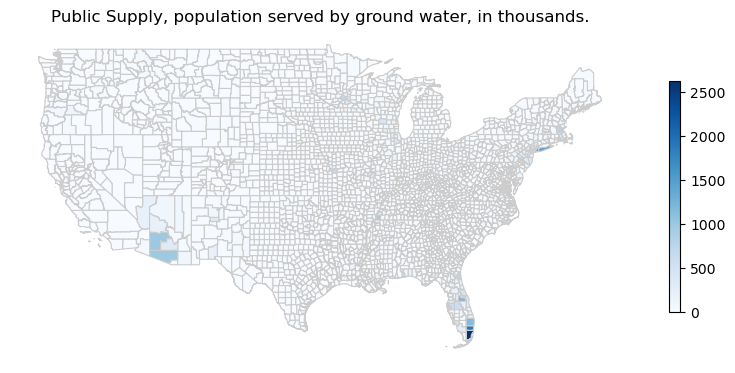

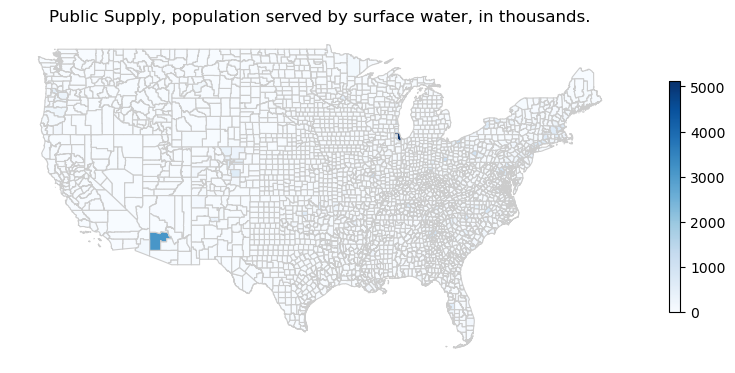

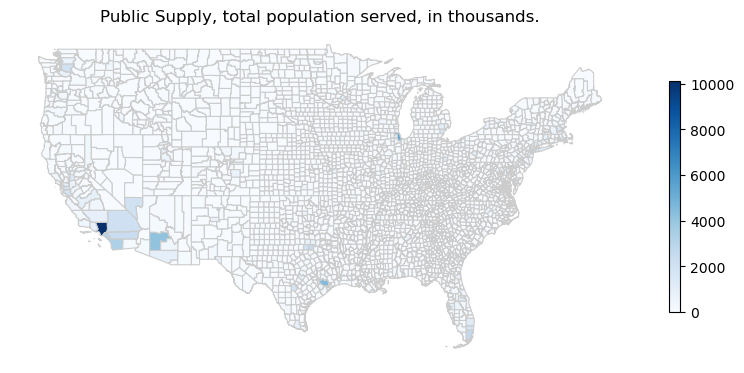

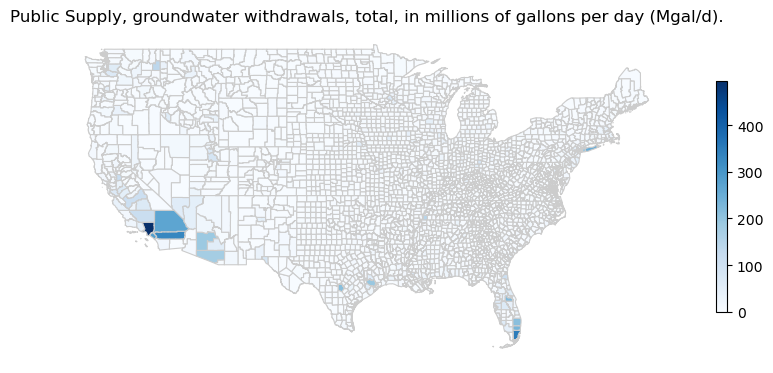

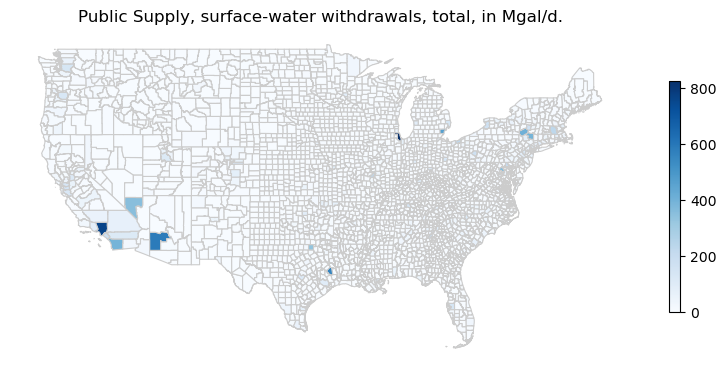

...

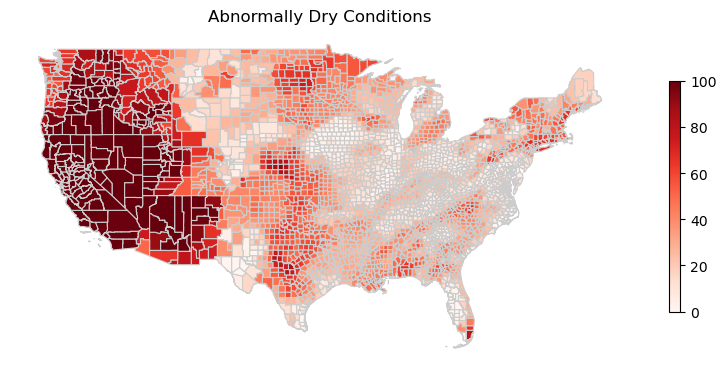

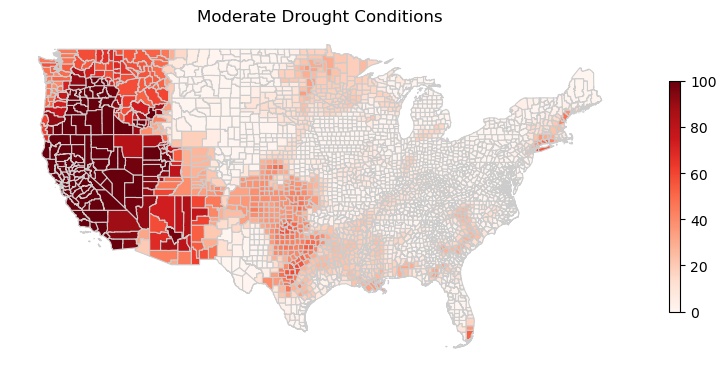

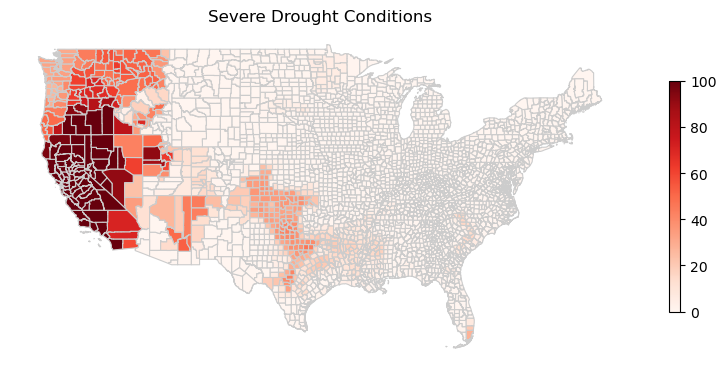

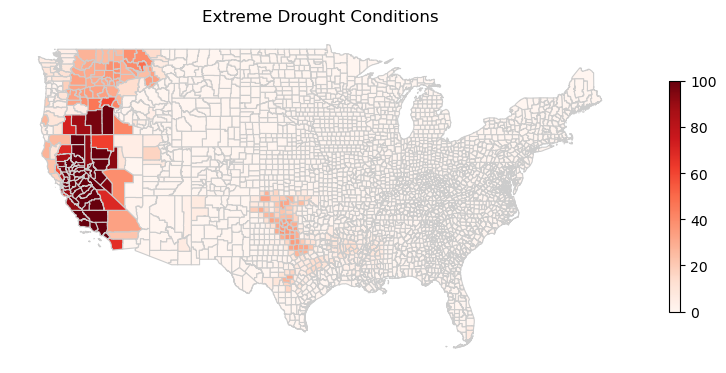

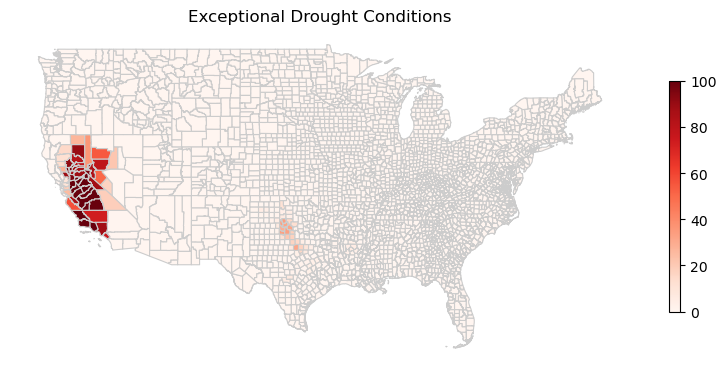

In [28]:
plot_with_legend(plot_titles[4:])